# Landslide Deformation & Precipitation Analysis using InSAR and CHIRPS

**Author:** Hakan Tanyas  
**Institution:** University of Twente / ITC  
**Environment:** Python 3.10 (Miniconda3), tested in Jupyter Notebook

In [ ]:
!pip install cdsapi

In [ ]:
!wget https://zenodo.org/records/15518847/files/SU.geojson?download=1  -O SU.geojson
!wget https://zenodo.org/records/15518847/files/S1a_desc_output.csv?download=1  -O S1a_desc_output.csv
!wget https://zenodo.org/records/15518847/files/S1b_asc_output.csv?download=1  -O S1b_asc_output.csv

In [2]:
## Step 0: Import Required Packages
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import xarray as xr
from shapely.geometry import Point
from pathlib import Path
import zipfile
import cdsapi


In [3]:
## Step 1: Load Input Files

# Load the slope units
slope_units = gpd.read_file("SU.geojson")
# Reproject to EPSG:4326 (lat/lon)
if slope_units.crs != "EPSG:4326":
    slope_units = slope_units.to_crs("EPSG:4326")

# Load the deformation points
desc_df = pd.read_csv("S1a_desc_output.csv")
asc_df = pd.read_csv("S1b_asc_output.csv")



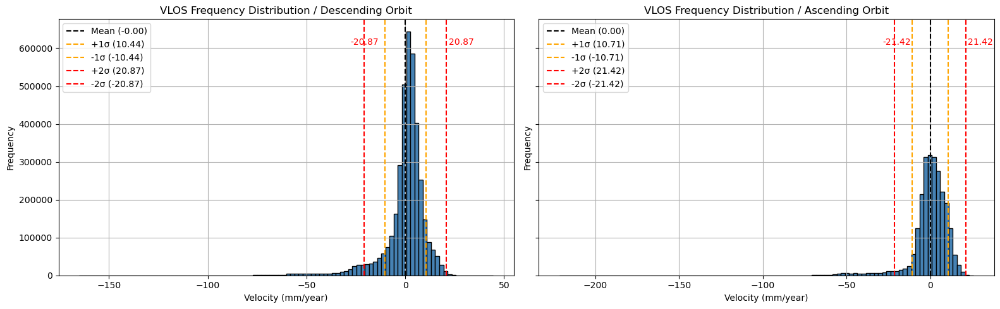

In [4]:
## Step 2: Plot Frequency Distributions of VLOS for Ascending and Descending Orbits

# Set up a side-by-side plot layout
fig, axs = plt.subplots(1, 2, figsize=(16, 5), sharey=True)

# Iterate over both datasets and plot histograms with statistical annotations
for ax, df, title in zip(
    axs,
    [desc_df, asc_df],
    ['Descending Orbit', 'Ascending Orbit']
):
    vel = df['VEL'].dropna()
    mean_vel = vel.mean()
    std_vel = vel.std()

    # Calculate thresholds
    plus_1sigma = mean_vel + std_vel
    minus_1sigma = mean_vel - std_vel
    plus_2sigma = mean_vel + 2 * std_vel
    minus_2sigma = mean_vel - 2 * std_vel

    # Plot histogram
    ax.hist(vel, bins=100, color='steelblue', edgecolor='black')
    ax.set_title(f'VLOS Frequency Distribution / {title}')
    ax.set_xlabel('Velocity (mm/year)')
    ax.set_ylabel('Frequency')

    # Overlay vertical lines for statistics
    ax.axvline(mean_vel, color='black', linestyle='--', label=f'Mean ({mean_vel:.2f})')
    ax.axvline(plus_1sigma, color='orange', linestyle='--', label=f'+1σ ({plus_1sigma:.2f})')
    ax.axvline(minus_1sigma, color='orange', linestyle='--', label=f'-1σ ({minus_1sigma:.2f})')
    ax.axvline(plus_2sigma, color='red', linestyle='--', label=f'+2σ ({plus_2sigma:.2f})')
    ax.axvline(minus_2sigma, color='red', linestyle='--', label=f'-2σ ({minus_2sigma:.2f})')

    # Add text labels for ±2σ
    ymax = ax.get_ylim()[1]
    ax.text(plus_2sigma + 1, ymax * 0.9, f'{plus_2sigma:.2f}', color='red')
    ax.text(minus_2sigma - 7, ymax * 0.9, f'{minus_2sigma:.2f}', color='red')

    ax.grid(True)
    ax.legend()

plt.tight_layout()
plt.show()


In [5]:
## Step 3: Filter High-Velocity Points

# Define thresholds (2 std dev from mean)
desc_std = desc_df['VEL'].std()
desc_mean = desc_df['VEL'].mean()
desc_extreme = desc_df[(desc_df['VEL'] >= desc_mean + 2*desc_std) | (desc_df['VEL'] <= desc_mean - 2*desc_std)]

asc_std = asc_df['VEL'].std()
asc_mean = asc_df['VEL'].mean()
asc_extreme = asc_df[(asc_df['VEL'] >= asc_mean + 2*asc_std) | (asc_df['VEL'] <= asc_mean - 2*asc_std)]


In [6]:
## Step 4: Visualize High-Velocity Points on Satellite Image

# Mapbox token
mapbox_token = 'pk.eyJ1IjoibGluZ2NoYW5nZW9zIiwiYSI6ImNtYWdrZzRmbzAyM2IybXMzcjB2czE2aTYifQ.9B6xpiwuwJnOiWdc0chglw'

# DESCENDING MAP
fig_desc = px.scatter_mapbox(
    desc_extreme,
    lat='LAT',
    lon='LON',
    color='VEL',
    color_continuous_scale='jet_r',
    range_color=[-100, 100],
    title='Descending Track: High VEL Points (|VEL| > ±2σ)',
    zoom=8,
    center={
        "lat": desc_extreme['LAT'].mean(),
        "lon": desc_extreme['LON'].mean()
    },
    height=600
)

fig_desc.update_traces(marker=dict(size=5))
fig_desc.update_layout(
    mapbox_style='satellite',
    mapbox_accesstoken=mapbox_token,
    margin={"r": 0, "t": 40, "l": 0, "b": 0}
)

# ASCENDING MAP
fig_asc = px.scatter_mapbox(
    asc_extreme,
    lat='LAT',
    lon='LON',
    color='VEL',
    color_continuous_scale='jet_r',
    range_color=[-100, 100],
    title='Ascending Track: High VEL Points (|VEL| > ±2σ)',
    zoom=8,
    center={
        "lat": asc_extreme['LAT'].mean(),
        "lon": asc_extreme['LON'].mean()
    },
    height=600
)

fig_asc.update_traces(marker=dict(size=5))
fig_asc.update_layout(
    mapbox_style='satellite',
    mapbox_accesstoken=mapbox_token,
    margin={"r": 0, "t": 40, "l": 0, "b": 0}
)

# Show plots
fig_desc.show()
fig_asc.show()



C:\Users\TanyasH1\AppData\Local\Temp\ipykernel_10336\894029141.py:7: DeprecationWarning: *scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/
  fig_desc = px.scatter_mapbox(
C:\Users\TanyasH1\AppData\Local\Temp\ipykernel_10336\894029141.py:31: DeprecationWarning:

*scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



In [7]:
## Step 5: Convert Points to GeoDataFrames

gdf_desc = gpd.GeoDataFrame(desc_extreme, geometry=gpd.points_from_xy(desc_extreme['LON'], desc_extreme['LAT']), crs="EPSG:4326")
gdf_asc = gpd.GeoDataFrame(asc_extreme, geometry=gpd.points_from_xy(asc_extreme['LON'], asc_extreme['LAT']), crs="EPSG:4326")


In [8]:
## Step 6: Join each scatterer to the Slope Unit it falls in

# Create GeoDataFrames
gdf_desc = gpd.GeoDataFrame(
    desc_extreme,
    geometry=[Point(xy) for xy in zip(desc_extreme['LON'], desc_extreme['LAT'])],
    crs="EPSG:4326"
)

gdf_asc = gpd.GeoDataFrame(
    asc_extreme,
    geometry=[Point(xy) for xy in zip(asc_extreme['LON'], asc_extreme['LAT'])],
    crs="EPSG:4326"
)

desc_join = gpd.sjoin(gdf_desc, slope_units, how="inner", predicate="intersects")
asc_join = gpd.sjoin(gdf_asc, slope_units, how="inner", predicate="intersects")

# Generate statistics for each slope unit
# Descending stats
desc_stats = desc_join.groupby('index_right').agg(
    count_desc=('VEL', 'count'),
    mean_desc=('VEL', 'mean'),
    std_desc=('VEL', 'std'),
    max_desc=('VEL', 'max')
)

# Ascending stats
asc_stats = asc_join.groupby('index_right').agg(
    count_asc=('VEL', 'count'),
    mean_asc=('VEL', 'mean'),
    std_asc=('VEL', 'std'),
    max_asc=('VEL', 'max')
)



In [9]:
## Step 7: Merge Statistics with Slope Units

# Keep only SUs that appear in both
common_su_ids = set(desc_stats.index) & set(asc_stats.index)

# Filter stats
desc_stats = desc_stats.loc[desc_stats.index.isin(common_su_ids)]
asc_stats = asc_stats.loc[asc_stats.index.isin(common_su_ids)]

# Identify slope units intersected in both tracks
common_su_ids = set(desc_stats.index) & set(asc_stats.index)

# Filter to common
desc_stats = desc_stats.loc[desc_stats.index.isin(common_su_ids)]
asc_stats = asc_stats.loc[asc_stats.index.isin(common_su_ids)]

# Merge with original geometry
su_common = slope_units.loc[slope_units.index.isin(common_su_ids)].copy()
su_common = su_common.join(desc_stats).join(asc_stats)

# View the result
print(su_common[['count_desc', 'mean_desc', 'std_desc', 'max_desc',
                 'count_asc', 'mean_asc', 'std_asc', 'max_asc']].head())


       count_desc  mean_desc  std_desc  max_desc  count_asc   mean_asc  \
13879           3 -24.247810  2.740361 -22.09255          2 -78.998225   
13881           2 -44.883920  2.087393 -43.40791          3 -70.136630   
14593           3  23.151307  1.453148  24.14607         29 -22.488006   
14607          12  21.758214  0.481291  22.51324          1 -22.519350   
14744           6 -61.296980  1.823839 -58.88555          2 -74.280375   

        std_asc   max_asc  
13879  0.353575 -78.74821  
13881  0.424967 -69.82371  
14593  1.160573 -21.58389  
14607       NaN -22.51935  
14744  0.694980 -73.78895  


In [10]:
## Step 8: Filter to Slope Units based on Number of Points (NP))

NP = 1  # <-- Change this value as you wish

su_filtered = su_common[
    (su_common['count_desc'] >= NP) &
    (su_common['count_asc'] >= NP)
].copy()


print(f"{len(su_filtered)} slope units with ≥5 scatterers in both tracks")

12 slope units with ≥5 scatterers in both tracks


In [11]:
## Step 9: Visualize Filtered Slope Units

# Project to UTM to compute accurate centroids
su_proj = su_filtered.to_crs("EPSG:32651")

# Compute bounding box for zooming
bounds = su_filtered.total_bounds  # [minx, miny, maxx, maxy]
lon_min, lat_min, lon_max, lat_max = bounds

# Compute center of bounding box
center_lat = (lat_min + lat_max) / 2
center_lon = (lon_min + lon_max) / 2

# Estimate zoom level based on extent size (heuristic)
lat_range = lat_max - lat_min
zoom_level = 12 if lat_range < 0.05 else 10 if lat_range < 0.1 else 8

# Add unique ID column for mapping
su_filtered["su_id"] = su_filtered.index.astype(str)

# Convert GeoDataFrame to GeoJSON
su_geojson = su_filtered.__geo_interface__

# Create map
fig = px.choropleth_mapbox(
    su_filtered,
    geojson=su_geojson,
    locations="su_id",
    color="mean_desc",  # Change as needed
    color_continuous_scale="jet_r",
    range_color=[-100, 100],
    mapbox_style="satellite",
    zoom=zoom_level,
    center={"lat": center_lat, "lon": center_lon},
    opacity=0.6,
    height=700,
    labels={"mean_desc": "Mean VEL (Desc)"}
)

fig.update_layout(
    title="Slope Units (filtered, colored by Mean Descending VEL)",
    mapbox_accesstoken='pk.eyJ1IjoibGluZ2NoYW5nZW9zIiwiYSI6ImNtYWdrZzRmbzAyM2IybXMzcjB2czE2aTYifQ.9B6xpiwuwJnOiWdc0chglw',
    margin={"r": 0, "t": 50, "l": 0, "b": 0}
)

fig.show()

# Create map
fig = px.choropleth_mapbox(
    su_filtered,
    geojson=su_geojson,
    locations="su_id",
    color="mean_asc",  # Change as needed
    color_continuous_scale="jet_r",
    range_color=[-100, 100],
    mapbox_style="satellite",
    zoom=zoom_level,
    center={"lat": center_lat, "lon": center_lon},
    opacity=0.6,
    height=700,
    labels={"mean_asc": "Mean VEL (Asc)"}
)

fig.update_layout(
    title="Slope Units (filtered, colored by Mean Ascending VEL)",
    mapbox_accesstoken='pk.eyJ1IjoibGluZ2NoYW5nZW9zIiwiYSI6ImNtYWdrZzRmbzAyM2IybXMzcjB2czE2aTYifQ.9B6xpiwuwJnOiWdc0chglw',
    margin={"r": 0, "t": 50, "l": 0, "b": 0}
)

fig.show()



C:\Users\TanyasH1\AppData\Local\Temp\ipykernel_10336\4046672948.py:25: DeprecationWarning:

*choropleth_mapbox* is deprecated! Use *choropleth_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



C:\Users\TanyasH1\AppData\Local\Temp\ipykernel_10336\4046672948.py:49: DeprecationWarning:

*choropleth_mapbox* is deprecated! Use *choropleth_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



In [12]:
## Step 10: Save Filtered Slope Units to KML/KMZ

# Reproject to WGS84 (required for Google Earth)
su_filtered_wgs84 = su_filtered.to_crs("EPSG:4326")

# Save to KML (KMZ = zipped KML)
su_filtered_wgs84.to_file("selected_slope_units.kml", driver='KML')

# Zip the KML into KMZ manually (Python way)
import zipfile
with zipfile.ZipFile("selected_slope_units.kmz", "w", zipfile.ZIP_DEFLATED) as kmz:
    kmz.write("selected_slope_units.kml")

In [13]:
## Step 11: User-Defined Slope Unit Selection

su_id = "14593"  # <-- Change this value for different slope units
su_selected = su_filtered[su_filtered["su_id"] == su_id]


In [14]:
## Step 12: Clip High-Velocity Points to Selected Slope Unit

# Convert to GeoSeries for intersection
from shapely.geometry import Point

# Create GeoDataFrames for the high-velocity scatterers
gdf_desc = gpd.GeoDataFrame(
    desc_extreme, geometry=gpd.points_from_xy(desc_extreme.LON, desc_extreme.LAT), crs="EPSG:4326"
)

gdf_asc = gpd.GeoDataFrame(
    asc_extreme, geometry=gpd.points_from_xy(asc_extreme.LON, asc_extreme.LAT), crs="EPSG:4326"
)

# Clip by the selected SU
desc_in_su = gdf_desc[gdf_desc.intersects(su_selected.geometry.values[0])]
asc_in_su = gdf_asc[gdf_asc.intersects(su_selected.geometry.values[0])]

# Convert extreme points to GeoDataFrames
points_desc = gpd.GeoDataFrame(
    desc_extreme,
    geometry=gpd.points_from_xy(desc_extreme['LON'], desc_extreme['LAT']),
    crs="EPSG:4326"
)

points_asc = gpd.GeoDataFrame(
    asc_extreme,
    geometry=gpd.points_from_xy(asc_extreme['LON'], asc_extreme['LAT']),
    crs="EPSG:4326"
)

# Ensure su_selected is not empty
if su_selected.empty:
    print("❌ No slope unit selected — check su_id.")
else:
    # Keep only points within the selected slope unit
    points_desc_in_su = gpd.sjoin(points_desc, su_selected, predicate="within", how="inner").copy()
    points_asc_in_su = gpd.sjoin(points_asc, su_selected, predicate="within", how="inner").copy()

    # Sample 5 points from each, if available
    points_desc_sample = points_desc_in_su.sample(n=min(5, len(points_desc_in_su)), random_state=1)
    points_asc_sample = points_asc_in_su.sample(n=min(5, len(points_asc_in_su)), random_state=2)

# Extract orbit-specific time series columns
desc_ts_columns = [col for col in desc_df.columns if col.startswith("D")]
asc_ts_columns = [col for col in asc_df.columns if col.startswith("D")]

# Extract time series data for sampled scatterers
desc_ts = desc_df.loc[points_desc_sample.index, desc_ts_columns].copy()
asc_ts = asc_df.loc[points_asc_sample.index, asc_ts_columns].copy()

# Add ID for tracking
desc_ts["scatterer_id"] = desc_ts.index.astype(str)
asc_ts["scatterer_id"] = asc_ts.index.astype(str)

# Melt into long format
desc_long = desc_ts.melt(id_vars="scatterer_id", var_name="date", value_name="deformation")
asc_long = asc_ts.melt(id_vars="scatterer_id", var_name="date", value_name="deformation")

# Convert 'D20200907' → datetime
desc_long["date"] = pd.to_datetime(desc_long["date"].str[1:], format="%Y%m%d")
asc_long["date"] = pd.to_datetime(asc_long["date"].str[1:], format="%Y%m%d")    


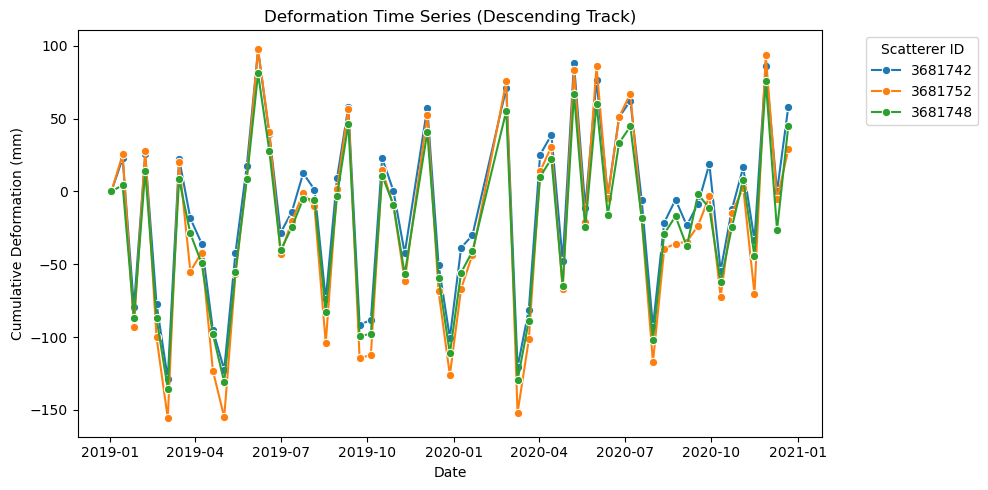

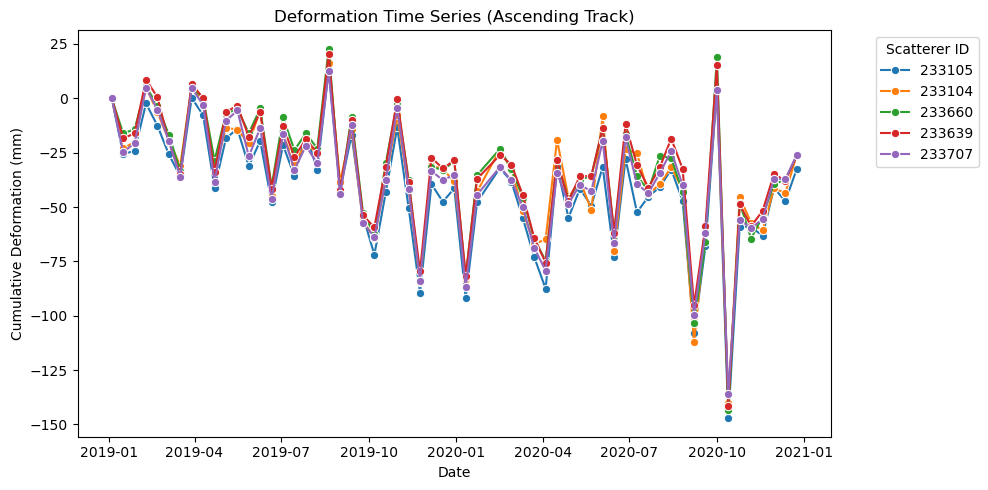

In [15]:
## Step 12: Plot Time Series for Selected Slope Unit

# Descending
plt.figure(figsize=(10, 5))
sns.lineplot(data=desc_long, x="date", y="deformation", hue="scatterer_id", marker="o")
plt.title("Deformation Time Series (Descending Track)")
plt.xlabel("Date")
plt.ylabel("Cumulative Deformation (mm)")
plt.legend(title="Scatterer ID", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Ascending
plt.figure(figsize=(10, 5))
sns.lineplot(data=asc_long, x="date", y="deformation", hue="scatterer_id", marker="o")
plt.title("Deformation Time Series (Ascending Track)")
plt.xlabel("Date")
plt.ylabel("Cumulative Deformation (mm)")
plt.legend(title="Scatterer ID", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [16]:
## Step 13: Extract Time Series Dates

# Get all columns starting with 'D'
ts_columns_desc = [col for col in desc_df.columns if col.startswith("D")]
ts_columns_asc  = [col for col in asc_df.columns if col.startswith("D")]

# Combine and sort
all_ts = sorted(set(ts_columns_desc + ts_columns_asc))

# Extract min/max date
start_date = pd.to_datetime(all_ts[0][1:], format="%Y%m%d").strftime("%Y-%m-%d")
end_date   = pd.to_datetime(all_ts[-1][1:], format="%Y%m%d").strftime("%Y-%m-%d")

print("Start:", start_date)
print("End  :", end_date)

Start: 2019-01-02
End  : 2020-12-24


In [17]:
## Step 14: Generate GEE Script to extract precipitation data

# Ensure correct CRS for SU and get bounding box
su_bbox = su_filtered.to_crs("EPSG:4326")
lon_min, lat_min, lon_max, lat_max = su_bbox.total_bounds

# Extract time range from deformation columns
ts_columns_desc = [col for col in desc_df.columns if col.startswith("D")]
ts_columns_asc  = [col for col in asc_df.columns if col.startswith("D")]
all_ts = sorted(set(ts_columns_desc + ts_columns_asc))

start_date = pd.to_datetime(all_ts[0][1:], format="%Y%m%d").strftime("%Y-%m-%d")
end_date   = pd.to_datetime(all_ts[-1][1:], format="%Y%m%d").strftime("%Y-%m-%d")

# Compose working GEE script
gee_script = f"""
var aoi = ee.Geometry.Rectangle([{lon_min:.4f}, {lat_min:.4f}, {lon_max:.4f}, {lat_max:.4f}]);

var startDate = '{start_date}';
var endDate = '{end_date}';

var chirps = ee.ImageCollection('UCSB-CHG/CHIRPS/DAILY')
               .filterBounds(aoi)
               .filterDate(startDate, endDate)
               .select('precipitation');

var dailyMean = chirps.map(function(img) {{
  var dateStr = img.date().format('YYYY-MM-dd');
  var mean = img.reduceRegion({{
    reducer: ee.Reducer.mean(),
    geometry: aoi,
    scale: 5000,
    maxPixels: 1e9
  }}).get('precipitation');
  
  return ee.Feature(null).set({{
    'date': dateStr,
    'precip_mm': mean
  }});
}});

var dailyTable = ee.FeatureCollection(dailyMean);

Export.table.toDrive({{
  collection: dailyTable,
  description: 'CHIRPS_precip_timeseries',
  fileFormat: 'CSV'
}});
"""

# Show it nicely
print("📋 Copy and paste the following into GEE:")
print(gee_script)


📋 Copy and paste the following into GEE:

var aoi = ee.Geometry.Rectangle([121.1539, 14.8590, 121.4099, 14.9311]);

var startDate = '2019-01-02';
var endDate = '2020-12-24';

var chirps = ee.ImageCollection('UCSB-CHG/CHIRPS/DAILY')
               .filterBounds(aoi)
               .filterDate(startDate, endDate)
               .select('precipitation');

var dailyMean = chirps.map(function(img) {
  var dateStr = img.date().format('YYYY-MM-dd');
  var mean = img.reduceRegion({
    reducer: ee.Reducer.mean(),
    geometry: aoi,
    scale: 5000,
    maxPixels: 1e9
  }).get('precipitation');
  
  return ee.Feature(null).set({
    'date': dateStr,
    'precip_mm': mean
  });
});

var dailyTable = ee.FeatureCollection(dailyMean);

Export.table.toDrive({
  collection: dailyTable,
  description: 'CHIRPS_precip_timeseries',
  fileFormat: 'CSV'
});



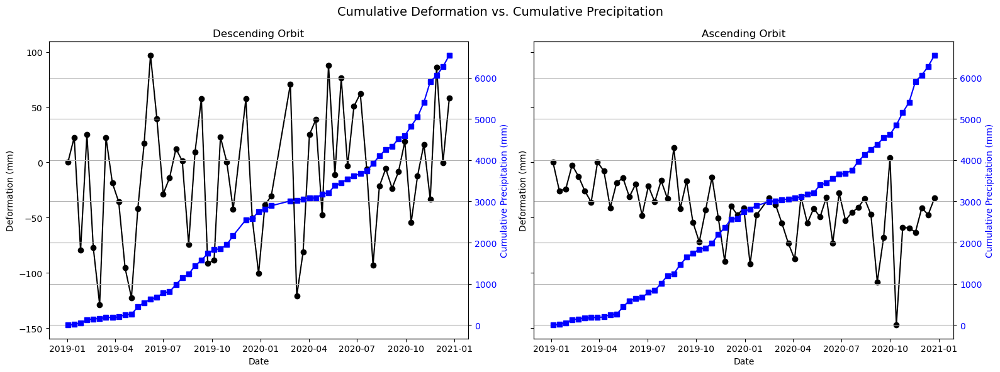

In [18]:
## Step 15: Plot Cumulative Deformation vs. Cumulative Precipitation

# Load precipitation
precip_df = pd.read_csv("CHIRPS_precip_timeseries.csv")
precip_df['date'] = pd.to_datetime(precip_df['date'])
precip_df.set_index('date', inplace=True)

# Choose sample points
index_desc = points_desc_sample.index[0]
index_asc = points_asc_sample.index[0]

# Extract deformation time series and dates
ts_columns_desc = [col for col in desc_df.columns if col.startswith("D")]
ts_dates_desc = [pd.to_datetime(col[1:], format="%Y%m%d") for col in ts_columns_desc]
deformation_desc = desc_df.loc[index_desc, ts_columns_desc].values.flatten()

ts_columns_asc = [col for col in asc_df.columns if col.startswith("D")]
ts_dates_asc = [pd.to_datetime(col[1:], format="%Y%m%d") for col in ts_columns_asc]
deformation_asc = asc_df.loc[index_asc, ts_columns_asc].values.flatten()

# Compute cumulative precipitation up to each deformation timestamp
def cumulative_precip_until(deformation_dates, precip_df):
    cumulative = []
    for date in deformation_dates:
        rain = precip_df.loc[:date]['precip_mm'].sum()
        cumulative.append(rain)
    return cumulative

cum_rain_desc = cumulative_precip_until(ts_dates_desc, precip_df)
cum_rain_asc = cumulative_precip_until(ts_dates_asc, precip_df)

# 5. Plot
fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

for ax, ts_dates, deformation, cum_rain, label in zip(
    axes,
    [ts_dates_desc, ts_dates_asc],
    [deformation_desc, deformation_asc],
    [cum_rain_desc, cum_rain_asc],
    ['Descending', 'Ascending']
):
    ax2 = ax.twinx()
    ax.plot(ts_dates, deformation, '-o', color='black', label='Deformation')
    ax.set_title(f"{label} Orbit")
    ax.set_xlabel("Date")
    ax.set_ylabel("Deformation (mm)", color='black')
    ax.tick_params(axis='y', labelcolor='black')
    
    ax2.plot(ts_dates, cum_rain, '-s', color='blue', label='Cumulative Precip')
    ax2.set_ylabel("Cumulative Precipitation (mm)", color='blue')
    ax2.tick_params(axis='y', labelcolor='blue')
    ax2.grid(True)

plt.suptitle("Cumulative Deformation vs. Cumulative Precipitation", fontsize=14)
plt.tight_layout()
plt.show()
